# Описание проекта

Заказчик этого исследования — сеть отелей «Как в гостях».

Чтобы привлечь клиентов, эта сеть отелей добавила на свой сайт возможность забронировать номер без предоплаты. Однако если клиент отменял бронирование, то компания терпела убытки. Сотрудники отеля могли, например, закупить продукты к приезду гостя или просто не успеть найти другого клиента.

Нужно разработать систему, которая предсказывает отказ от брони. Если модель покажет, что бронь будет отменена, то клиенту предлагается внести депозит. Размер депозита — 80% от стоимости номера за одни сутки и затрат на разовую уборку. Деньги будут списаны со счёта клиента, если он всё же отменит бронь.

# Задачи проекта

1. Оценить прибыль отеля без внедрения депозитов.
2. Оценить прибыль, которую принесёт выбранная модель за год.
3. Описать модель, которая решает задачу с наибольшей выгодой для бизнеса. 
4. Дать бизнесу рекомендации по результатам проделанной работы.

# Инструменты
pandas  
pandas_profiling  
numpy  
matplotlib  
SMOTE  
seaborn  
sklearn  
wordcloud

In [28]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sn
import pandas_profiling



In [27]:
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_auc_score, confusion_matrix, f1_score, ConfusionMatrixDisplay, recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.inspection import permutation_importance
import time
import locale
import os
from wordcloud import WordCloud
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE 
from joblib import parallel_backend

In [5]:
#Загружаем исходные данные
pth1_train = '/datasets/hotel_train.csv'
pth1_test = '/datasets/hotel_test.csv'
pth2_train = 'E:\Data\_Projects\datasets\hotel_train.csv'
pth2_test = 'E:\Data\_Projects\datasets\hotel_test.csv'

if os.path.exists(pth1_train) and os.path.exists(pth1_test):
    df = pd.read_csv(pth1_train)
    dft = pd.read_csv(pth1_test)
elif os.path.exists(pth2_train) and os.path.exists(pth2_test):
    df = pd.read_csv(pth2_train)
    dft = pd.read_csv(pth2_test)
else:
    print('Something is wrong')


### 1. Предобработка и исследовательский анализ данных

Проводим знакомсвто с датасетом.

In [6]:
pandas_profiling.ProfileReport(df) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**ВЫВОД**
1. Первое что очень радует это отсутствие пропусков и явных дубликатов.
2. Важная для нас переменная "is_canceled" встречается достаточно часто примерно (24 из 65 раз), чтобы обучить модель, но надо будет ещё *проверить насколько равномерно она распределена*. 
3. arrival_date_month - будет нам важен для учёта сезонных надбавок, но при этом 8% там каких-то странных значений. *Надо проверить на предмет неявных дубликатов.*
4. arrival_date_week_number - содержит подозрительный всплеск после 50 недели. *Надо будет исследовать на предмет корректности данных.*
5. adults - незначительное число когда заезжает 0 взрослых. Может конечно это чисто детская экскурсия, но всё равно сомнительно. К счастью количество таких значений статистически незначимо.
6. babies - вызывают подозрения значения 10 и 9 грудных детей, но их также крайне мало. **Вообще моладецев больше 1 встречается крайне мало. Так что сделаем это переменной, принимающей значения 1 или 0, а хвостом пожертвуем.**
7. previous_cancellations -есть счётное статистически незначимое количество гостей, которые снимали бронь более 20 раз. Наверное это какие-то роботы, или тестировщики сайта. 
8. previous_bookings_not_canceled - количество подтверждённых заказов у клиента, интересный показатель, правда почти целиком состоит из 0. Скорее всего будет бесполезен в модели.
9. booking_changes - *можно пожертвовать ховтсом с вероятностями 0,1, начиная с 5.*
10. days_in_waiting_list - 95% значения 0,остальное - какая-то строномия. *Да и вообще экономический смысл этого показателя не до конца ясен. Заявка попадает в лист ожидания и висит там месяцами из-за того, что у нас в отеле кто-то долго думает, или клиент не может определиться готов он заехать или нет? Учитывая разброс значений, просто не будем брать этот показатель в модель*.
11. stays_in_week_nights, stays_in_weekend_nights показатели схожие по смыслу, но один из них в базе фигурирует как категория, а второй как реальное число. *Надо всё привести к реальному виду и проверить корреляцию.*

**12. required_car_parking_spaces - практически не встречается в количестве больше одного. Можно сделать 1 или 0.**


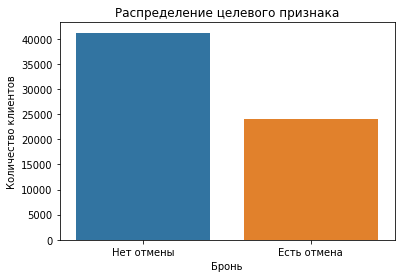

In [8]:
#Визуализируем равномерность распределения is_canceled	.
sn.countplot(x ='is_canceled', data= df, order= df['is_canceled'].value_counts().index)
 
# Show the plot
plt.title('Распределение целевого признака')
plt.xlabel('Бронь')
plt.xticks([0,1],['Нет отмены', 'Есть отмена'])
plt.ylabel('Количество клиентов')
plt.show()

Наблюдаем, что имеется некоторый дисбаланс классов. Попробуем его устранить когда будем готовить данные для обучения модели. Сейчас пока оставим так.

In [9]:
print(df['arrival_date_month'].value_counts(ascending=True))

January      1892
February     3358
March        4148
June         4659
May          4677
April        4804
December     5497
July         5718
November     5761
August       6678
September    8782
October      9255
Name: arrival_date_month, dtype: int64


При ближайшем рассмотрении некорректных значений не обнаружено.

In [10]:
display(df.loc[df['arrival_date_week_number']>=50].sample(n=10, random_state=123456))
df['arrival_date_week_number'].loc[df['arrival_date_week_number']>=50].value_counts(ascending=True)

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights
2282,2299,1,59.0,2015,December,52,26,2,6,2.0,...,0,0,0,A,1,0,Transient,0,1,8
22553,30493,0,5.0,2015,December,52,20,1,0,2.0,...,0,0,0,A,3,0,Transient,0,1,1
64298,83014,0,31.0,2016,December,50,8,0,3,1.0,...,0,0,0,A,0,0,Transient,0,0,3
64082,82797,0,13.0,2016,December,50,5,1,0,1.0,...,0,0,0,A,0,0,Transient,0,0,1
16168,18963,0,14.0,2016,December,50,5,1,2,2.0,...,0,0,0,A,0,0,Transient-Party,0,0,3
9197,11657,0,5.0,2015,December,51,19,0,1,2.0,...,0,0,0,A,0,0,Transient-Party,0,1,1
44088,62523,0,5.0,2015,December,50,8,0,3,2.0,...,0,0,0,A,1,0,Transient,0,0,3
22790,30730,1,148.0,2015,December,53,31,1,3,2.0,...,0,0,0,A,0,98,Transient,0,0,4
43102,61516,1,26.0,2015,December,51,13,2,2,1.0,...,1,1,0,A,0,0,Transient,0,0,4
22525,30465,0,1.0,2015,December,51,16,0,1,1.0,...,0,0,0,A,0,0,Transient,1,0,1


51     753
52     928
50    1256
53    1502
Name: arrival_date_week_number, dtype: int64

Если подумать, то 53 недели бывают, особенно если год високосный, а в конце года люди могут планировать оттдых, который может и сораваться, так как это время всегда напряжённое и все пытаются всё успеть. Так что не будем исключать эти данные из выборки.

In [11]:
#удалим строки с аномальным количеством взрослых и младенцев, благо их совсем немного.
df=df[df['adults']!=0]
df=df[df['babies']<=1]
df=df[df['previous_cancellations']<20]
df=df[df['booking_changes']<5]
df=df[df['required_car_parking_spaces']<=1]
print(df['adults'].value_counts(ascending=True))
print(df['babies'].value_counts(ascending=True))
print(df['booking_changes'].value_counts(ascending=True))
print(df['previous_cancellations'].value_counts(ascending=True))
print(df['required_car_parking_spaces'].value_counts(ascending=True))

4.0       13
3.0     2850
1.0    13191
2.0    48825
Name: adults, dtype: int64
1.0      443
0.0    64436
Name: babies, dtype: int64
4      148
3      404
2     1743
1     6581
0    56003
Name: booking_changes, dtype: int64
4         5
6         7
14       11
13       12
5        13
19       17
11       35
3        51
2        54
1      5366
0     59308
Name: previous_cancellations, dtype: int64
1     3659
0    61220
Name: required_car_parking_spaces, dtype: int64


Теперь мы избавились от "выбросов" по 0 взрослых, 1+ младенцев и 1+ парковочных мест, и более чем 20 аннулированных броней и  5 измененных броней. На этом заканчиваем устранение выбросов.

In [12]:
#Теперь сделаем числовыми те категориальные переменные, которые отражают счётные параметры.
df['stays_in_weekend_nights'] = df['stays_in_weekend_nights'].astype(float)
df['adults'] = df['adults'].astype(float)
df['children'] = df['children'].astype(float)
#Повторим для тестового набора данных

dft['stays_in_weekend_nights'] = dft['stays_in_weekend_nights'].astype(float)
dft['adults'] = dft['adults'].astype(float)
dft['children'] = dft['children'].astype(float)

**Пара слов  о корреляции**

1. Корреляция с параметром id носит случайный характер и мы его в модель включать точно не будем. Не имеет экономического смысла.
2. Номер недели и номер месяца имеют вполне календарное объяснение высокой корреляции, возьмёт только один показатель в модель.
3. Аналогичная картина наблюдается по total_nights и stays_in_week_nights, stays_in_weekend_nights. 
Больше ярких точек корреляции не обнаружено.


In [13]:
print(df['stays_in_weekend_nights'].corr(df['stays_in_week_nights']),'-корреляция между отдыхом в выходные и будние')
print(df['stays_in_weekend_nights'].corr(df['total_nights']),'-корреляция между отдыхом в выходные и общим отдыхом')
print(df['stays_in_week_nights'].corr(df['total_nights']),'-корреляция между отдыхом в будние и общим отдыхом')

0.19743165263372264 -корреляция между отдыхом в выходные и будние
0.6452119012900579 -корреляция между отдыхом в выходные и общим отдыхом
0.8763507701299308 -корреляция между отдыхом в будние и общим отдыхом


In [14]:
print('Всего явных дубликатов=',len(df)- len(df.drop_duplicates ()))


Всего явных дубликатов= 0


Минимальная кореляция наблюдается между количеством ночей в будние и выходные, значит возьмём эти два показателя в модель, а общее число ночей не будем брать.

**ОБЩИЙ ВЫВОД**

Итак, мы составили первое представление о наборе обучающих данных, вычистили выбросы, убедились в отсутствии пропусков и дубликатов. Выделилил показатели без экономического смысла или с высокой корреляцией, которые не следует включать в модель классификации.

Заметили что наблюдается некоторый дисбаланс целевого признака.

В целом набор данных можно охарактеризовать как высококачественный. 

## Формулировка ML-задачи на основе бизнес-задачи

Цель модели машинного обучения - предсказать отмену бронирования.
- ШАГ 1. Выкидываем из обучающего набора данных показатели лишённые экономического смысла или с высокой взаимной корреляцией.
- ШАГ 2. Преобразовываем категориальные переменные в числовые, используя One-Hot-Encoding.
- ШАГ 3. Боремся с дисбалансом целевых значений.
- ШАГ 4. Обучаем несколько классификационных моделей.
- ШАГ 5. Выбираем самую лучшую модель на основе показателя F1.
- ШАГ 6. Проводим оптимизацию гипер-параметров лучшей модели.
- ШАГ 7. Проверяем результативность лучшей модели на тестовой выборке, используя матрицу ошибок.
- ШАГ 8. Рассчитываем величину предоплаты по тем броням, из тестовой выборки, где модель предсказывает отмену.
- ШАГ 9. Рассчитываем чистую прибыль сети отелей с учётом эффекта от предоплаты.
- ШАГ 10. Сравниваем величину чистой прибыли с бюджетом проекта.

## Разработка модели ML

### Выкидываем из обучающего набора данных показатели лишённые экономического смысла или с высокой взаимной корреляцией.

In [15]:
df=df.drop(['arrival_date_month','id','previous_bookings_not_canceled','days_in_waiting_list','total_nights','arrival_date_year'], axis=1)
dft=dft.drop(['arrival_date_month','id','previous_bookings_not_canceled','days_in_waiting_list','total_nights','arrival_date_year'], axis=1)

### Преобразовываем категориальные переменные

Тут у нас есть особенность. 
1. Страны. Страны имеют обыкновение разваливаться на части или объединяться в империи. Так что список стран потенциально бесконечен. Но значимая статистика у нас набрана по семи штукам. Так что ограничимся тут только самыми частыми названиями.
2. Остальные категориальные признаки имеют закрытый перечень, но опять-таки вдруг тестовый датасет будет собран только из тех, кто живёт в самых дорогие номерах и не заказывает никакой пищи. Надо убедиться, что количество колонок в общучающем датасете и тестовом будет всегда одинаково.

In [16]:
#сделаем список текстовых столбцов
txt_list=['meal','country','distribution_channel','reserved_room_type', 'customer_type']
#удалим лишние пробелы
for txt in txt_list:
    df[txt]=df[txt].str.strip()
    dft[txt]=dft[txt].str.strip()

In [17]:
#Выборочная проверка того, что пробелы и правда пропали
print(df['meal'].unique())

['BB' 'FB' 'HB' 'SC']


In [18]:
#Сделаем закрытый перечень стран по которым есть статистика, остальные запишем в "прочие"
countries_to_keep=['PRT', 'FRA','GBR','ESP','DEU','ITA','IRL']
df.loc[~df.country.isin(countries_to_keep),'country']='other'
dft.loc[~dft.country.isin(countries_to_keep),'country']='other'

In [19]:
y=df['is_canceled']

In [20]:
#Сделаем списки категориальных и числовых столбцов
categorical_columns = ['babies','meal','country','distribution_channel','is_repeated_guest',
                       'reserved_room_type','customer_type','required_car_parking_spaces']
numeric_columns = ['lead_time','arrival_date_week_number','arrival_date_day_of_month','stays_in_weekend_nights',
                  'stays_in_week_nights','adults','children','previous_cancellations','booking_changes','total_of_special_requests']

encoder = OneHotEncoder(drop='first', handle_unknown='ignore')
#Кодируем категориальные столбцы
encoder.fit(df[categorical_columns])
features_train_encoded = pd.DataFrame(
    encoder.transform(df[categorical_columns]).toarray(),
    columns=encoder.get_feature_names_out(categorical_columns),
    index=df.index
)
#Объдтняем с числовыми столбцами
x = pd.concat((df[numeric_columns], features_train_encoded), axis=1)
#Теперь тоже самое для тестовой выборки
yt=dft['is_canceled']
features_test_encoded = pd.DataFrame(
    encoder.transform(dft[categorical_columns]).toarray(),
    columns=encoder.get_feature_names_out(categorical_columns),
    index=dft.index
)
xt = pd.concat((dft[numeric_columns], features_test_encoded), axis=1)

C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\preprocessing\_encoders.py:202: UserWarning: Found unknown categories in columns [0, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [21]:
# посмотрим на то, что получилось
pd.set_option('display.max_columns', None)
display(x.head(8))

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,previous_cancellations,booking_changes,total_of_special_requests,babies_1.0,meal_FB,meal_HB,meal_SC,country_ESP,country_FRA,country_GBR,country_IRL,country_ITA,country_PRT,country_other,distribution_channel_Direct,distribution_channel_GDS,distribution_channel_TA/TO,is_repeated_guest_1,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,customer_type_Group,customer_type_Transient,customer_type_Transient-Party,required_car_parking_spaces_1
0,7.0,27,1,0.0,1,1.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,14.0,27,1,0.0,2,2.0,0.0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,27,1,0.0,2,2.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,9.0,27,1,0.0,2,2.0,0.0,0,0,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,85.0,27,1,0.0,3,2.0,0.0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
5,75.0,27,1,0.0,3,2.0,0.0,0,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6,23.0,27,1,0.0,4,2.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
7,18.0,27,1,0.0,4,2.0,1.0,0,1,1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


### Боремся с дисбалансом целевых значений.

In [22]:
y.shape

(64879,)

In [23]:
x.shape

(64879, 35)

In [24]:
#Используем технику передискретизации синтетических меньшинств чтобы устранить дисбаланс классов
sm = SMOTE(random_state=1)
X_sm, y_sm = sm.fit_resample(x, y)

print(f'''Shape of X before SMOTE: {x.shape}
Shape of X after SMOTE: {X_sm.shape}''')

print('\nBalance of positive and negative classes (%):')
y_sm.value_counts(normalize=True) * 100

Shape of X before SMOTE: (64879, 35)
Shape of X after SMOTE: (81950, 35)

Balance of positive and negative classes (%):


0    50.0
1    50.0
Name: is_canceled, dtype: float64

In [25]:
x=X_sm
y=y_sm

Мы дополнили набор данных для обучения таким образом, чтобы целевой признак принимал значение 0 и 1 с одинаковой частотой. Самое то для классификационных моделей. Посмотрим теперь, хороши ли будут обученные на таком наборе модели.

### Обучаем несколько классификационных моделей.

In [29]:
#Создадим словать, с моделями которые будем проверять.
dict_classifiers = {
    "Logistic Regression": LogisticRegression(random_state=0),
    "Gradient Boosting Classifier": GradientBoostingClassifier(n_estimators=1000,random_state=0),
    "Decision Tree": tree.DecisionTreeClassifier(random_state=0),
    "Random Forest": RandomForestClassifier(n_estimators=1000,random_state=0),
    "Neural Net": MLPClassifier(alpha = 1,random_state=0),
    "AdaBoost":   AdaBoostClassifier(random_state=0)
}

Напишем процедуру, обучающую модели по предложенным выборкам, и сразу же считал статистику по всем.

In [30]:
def batch_classify(X_train, Y_train, no_classifiers = 5, verbose = True):    
    #Проведём сразу кросс-валидацию:
    cross_validator = pd.DataFrame(columns=['model','F1','roc_auc','recall'])
    for classifier_name, classifier in (list(dict_classifiers.items())):
        t_start = time.perf_counter()
        with parallel_backend('threading', n_jobs=4):
            scores = cross_validate(classifier, x, y, cv=3,
                                    scoring=('f1', 'roc_auc', 'recall'), return_train_score=True, verbose=5)
            cross_validator.loc[len(cross_validator)] = [classifier_name,sum(scores['test_f1']) / len(scores['test_f1']),sum(scores['test_roc_auc']) / len(scores['test_roc_auc']),sum(scores['test_recall']) / len(scores['test_recall'])]   
            t_end = time.perf_counter()
            t_diff = t_end - t_start

            if verbose:
                print("trained {c} in {f:.2f} s".format(c=classifier_name, f=t_diff))
    return cross_validator

In [31]:
dict_models = batch_classify(x, y, no_classifiers = 6)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative

[CV] END  f1: (train=0.794, test=0.695) recall: (train=0.782, test=0.646) roc_auc: (train=0.888, test=0.802) total time=   0.8s
[CV] END  f1: (train=0.769, test=0.740) recall: (train=0.751, test=0.785) roc_auc: (train=0.862, test=0.823) total time=   0.8s
[CV] END  f1: (train=0.807, test=0.744) recall: (train=0.817, test=0.804) roc_auc: (train=0.882, test=0.821) total time=   0.8s
trained Logistic Regression in 0.99 s
[CV] END  f1: (train=0.888, test=0.806) recall: (train=0.877, test=0.974) roc_auc: (train=0.959, test=0.936) total time=  56.9s
[CV] END  f1: (train=0.915, test=0.722) recall: (train=0.908, test=0.782) roc_auc: (train=0.974, test=0.831) total time= 1.1min
[CV] END  f1: (train=0.932, test=0.664) recall: (train=0.910, test=0.539) roc_auc: (train=0.983, test=0.832) total time= 1.1min
trained Gradient Boosting Classifier in 68.13 s


[Parallel(n_jobs=4)]: Done   3 out of   3 | elapsed:  1.1min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


[CV] END  f1: (train=0.992, test=0.797) recall: (train=0.992, test=0.957) roc_auc: (train=1.000, test=0.753) total time=   0.1s
[CV] END  f1: (train=0.995, test=0.701) recall: (train=0.994, test=0.629) roc_auc: (train=1.000, test=0.735) total time=   0.1s
[CV] END  f1: (train=0.996, test=0.740) recall: (train=0.996, test=0.822) roc_auc: (train=1.000, test=0.713) total time=   0.1s
trained Decision Tree in 0.30 s


[Parallel(n_jobs=4)]: Done   3 out of   3 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


[CV] END  f1: (train=0.995, test=0.726) recall: (train=0.994, test=0.605) roc_auc: (train=1.000, test=0.851) total time=  40.7s
[CV] END  f1: (train=0.992, test=0.829) recall: (train=0.993, test=0.989) roc_auc: (train=0.999, test=0.957) total time=  41.8s
[CV] END  f1: (train=0.996, test=0.754) recall: (train=0.996, test=0.813) roc_auc: (train=1.000, test=0.846) total time=  43.5s
trained Random Forest in 56.84 s


[Parallel(n_jobs=4)]: Done   3 out of   3 | elapsed:   56.7s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


[CV] END  f1: (train=0.838, test=0.741) recall: (train=0.842, test=0.804) roc_auc: (train=0.917, test=0.825) total time=  28.5s
[CV] END  f1: (train=0.825, test=0.759) recall: (train=0.855, test=0.735) roc_auc: (train=0.911, test=0.847) total time=  33.2s
[CV] END  f1: (train=0.828, test=0.759) recall: (train=0.850, test=0.883) roc_auc: (train=0.911, test=0.845) total time=  33.5s
trained Neural Net in 33.68 s


[Parallel(n_jobs=4)]: Done   3 out of   3 | elapsed:   33.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


[CV] END  f1: (train=0.816, test=0.809) recall: (train=0.812, test=0.908) roc_auc: (train=0.906, test=0.906) total time=   1.6s
[CV] END  f1: (train=0.853, test=0.762) recall: (train=0.855, test=0.811) roc_auc: (train=0.930, test=0.849) total time=   1.7s
[CV] END  f1: (train=0.865, test=0.676) recall: (train=0.857, test=0.568) roc_auc: (train=0.943, test=0.837) total time=   1.8s
trained AdaBoost in 2.66 s


[Parallel(n_jobs=4)]: Done   3 out of   3 | elapsed:    2.5s finished


,model,F1,roc_auc,recall
0,Logistic Regression,0.726426,0.815513,0.745160
5,AdaBoost,0.748850,0.864112,0.762342
1,Gradient Boosting Classifier,0.730471,0.866221,0.764856
3,Random Forest,0.769824,0.884945,0.801952
2,Decision Tree,0.745942,0.733646,0.802733
4,Neural Net,0.753017,0.839068,0.807566


In [32]:
display(dict_models.sort_values('recall'))

,model,F1,roc_auc,recall
0,Logistic Regression,0.726426,0.815513,0.745160
5,AdaBoost,0.748850,0.864112,0.762342
1,Gradient Boosting Classifier,0.730471,0.866221,0.764856
3,Random Forest,0.769824,0.884945,0.801952
2,Decision Tree,0.745942,0.733646,0.802733
4,Neural Net,0.753017,0.839068,0.807566


Удивительное дело, но лучшие показатели у "Neural Net". И даже показатель F1 у него при этом весьма неплохой. Запоним его как нашу лучшую модель. 

In [36]:
best_model=MLPClassifier(alpha = 1,random_state=0, verbose=0, max_iter=25)


Iteration 16, loss = 0.51038972
Iteration 13, loss = 0.65224918
Iteration 20, loss = 0.63544755
Iteration 16, loss = 0.75003288
Iteration 20, loss = 0.63093945
Iteration 13, loss = 0.68063891
Iteration 19, loss = 0.66799056
Iteration 16, loss = 0.37263949
Iteration 5, loss = 0.47572216
Iteration 5, loss = 0.40363984
Iteration 7, loss = 0.64601981
Iteration 16, loss = 0.74005830
Iteration 16, loss = 0.44652975
Iteration 7, loss = 0.68462800
Iteration 13, loss = 0.37497546
Iteration 13, loss = 0.45119611
Iteration 11, loss = 0.37387684
Iteration 21, loss = 0.57536041
Iteration 11, loss = 0.45229881
Iteration 14, loss = 0.65061240
Iteration 17, loss = 0.51045239
Iteration 17, loss = 0.75000142
Iteration 17, loss = 0.43284328
Iteration 21, loss = 0.63378286
Iteration 21, loss = 0.62944753
Iteration 14, loss = 0.67704776
Iteration 20, loss = 0.66625304
Iteration 8, loss = 0.63092850
Iteration 6, loss = 0.47181465
Iteration 17, loss = 0.74000280
Iteration 8, loss = 0.68313638
Iteration 6, l

C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 20, loss = 0.43384895
Iteration 20, loss = 0.44470193
Iteration 12, loss = 0.60285591
Iteration 25, loss = 0.62362665
Iteration 18, loss = 0.66806671
Iteration 24, loss = 0.65702081
Iteration 12, loss = 0.65941921
Iteration 17, loss = 0.37189885
Iteration 21, loss = 0.73982795
Iteration 25, loss = 0.62550486
Iteration 15, loss = 0.37556555


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 0.44561224
Iteration 15, loss = 0.44938866
Iteration 10, loss = 0.46206479
Iteration 19, loss = 0.62995712
Iteration 13, loss = 0.60103803
Iteration 21, loss = 0.37287204
Iteration 10, loss = 0.39163576
Iteration 19, loss = 0.66799056
Iteration 13, loss = 0.65438690
Iteration 21, loss = 0.44575774
Iteration 25, loss = 0.65483000


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 21, loss = 0.51036581
Iteration 21, loss = 0.43478493
Iteration 22, loss = 0.73979014
Iteration 18, loss = 0.37243853
Iteration 16, loss = 0.37263949
Iteration 16, loss = 0.44652975
Iteration 18, loss = 0.44734626
Iteration 11, loss = 0.46366049Iteration 20, loss = 0.63093945

Iteration 14, loss = 0.59762146
Iteration 14, loss = 0.64745273
Iteration 20, loss = 0.66625304
Iteration 11, loss = 0.38553716
Iteration 22, loss = 0.37535696
Iteration 22, loss = 0.44451456
Iteration 23, loss = 0.73976063
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 22, loss = 0.51041080
Iteration 22, loss = 0.43319982
Iteration 19, loss = 0.37565149
Iteration 17, loss = 0.37189885
Iteration 21, loss = 0.62944753
Iteration 15, loss = 0.59235358
Iteration 17, loss = 0.44561224
Iteration 12, loss = 0.46004879
Iteration 19, loss = 0.44792214
Iteration 15, loss = 0.64750008
Iteration 21, loss = 0.66206769
Iteration 12, loss = 0.38555269
Iteration 23, 

C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 24, loss = 0.61671507
Iteration 18, loss = 0.63303507
Iteration 24, loss = 0.65702081
Iteration 22, loss = 0.37535696
Iteration 20, loss = 0.37114620
Iteration 15, loss = 0.45701675
Iteration 25, loss = 0.50909332
Iteration 20, loss = 0.44470193

C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 22, loss = 0.44451456
Iteration 25, loss = 0.43288537
Iteration 19, loss = 0.56603383
Iteration 15, loss = 0.38552847
Iteration 25, loss = 0.62362665


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 0.63210918
Iteration 25, loss = 0.65483000


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 23, loss = 0.37162587
Iteration 16, loss = 0.45863040
Iteration 21, loss = 0.37287204
Iteration 20, loss = 0.57991542
Iteration 21, loss = 0.44575774
Iteration 23, loss = 0.44395552
Iteration 16, loss = 0.38817622
Iteration 20, loss = 0.62427161
Iteration 24, loss = 0.37219634
Iteration 17, loss = 0.45454757
Iteration 21, loss = 0.56379243
Iteration 22, loss = 0.37535696
Iteration 21, loss = 0.63095196
Iteration 22, loss = 0.44451456
Iteration 24, loss = 0.44347248
Iteration 17, loss = 0.37913693
Iteration 22, loss = 0.55122263
Iteration 18, loss = 0.45825367
Iteration 25, loss = 0.37148288
Iteration 22, loss = 0.61887664

C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 23, loss = 0.37162587
Iteration 25, loss = 0.44365589
Iteration 23, loss = 0.44395552
Iteration 18, loss = 0.38208103


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 23, loss = 0.56190535
Iteration 19, loss = 0.45873746
Iteration 23, loss = 0.60762353
Iteration 24, loss = 0.37219634
Iteration 19, loss = 0.38230816
Iteration 24, loss = 0.44347248
Iteration 24, loss = 0.55219630
Iteration 24, loss = 0.61775614
Iteration 20, loss = 0.45525580
Iteration 25, loss = 0.37148288
Iteration 20, loss = 0.37715936
Iteration 25, loss = 0.44365589
Iteration 25, loss = 0.55085722


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 25, loss = 0.60976631
Iteration 21, loss = 0.45769388
Iteration 21, loss = 0.38051044


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 22, loss = 0.45220850
Iteration 22, loss = 0.37909312
Iteration 23, loss = 0.45143006
Iteration 23, loss = 0.37791695
Iteration 24, loss = 0.44973175
Iteration 24, loss = 0.37554323
Iteration 25, loss = 0.44859897
Iteration 25, loss = 0.37744508


C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Admin\practicum\practicum_env\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


###  Проводим оптимизацию гипер-параметров лучшей модели.

In [40]:
import warnings
warnings.filterwarnings('ignore')

In [41]:
activation=['identity', 'logistic', 'tanh', 'relu']
solver=['lbfgs', 'sgd', 'adam']
learning_rate=['constant', 'invscaling', 'adaptive']

param_grid = {'activation': activation,
               'learning_rate': learning_rate,
               'solver': solver,
               }
with parallel_backend('threading', n_jobs=4):
    gs = GridSearchCV(best_model, param_grid, cv = 2, verbose = 0, n_jobs=-1, scoring='recall')
    gs.fit(x, y)
    rfc_3 = gs.best_estimator_
    gs.best_params_

In [42]:
gs.best_params_

{'activation': 'tanh', 'learning_rate': 'constant', 'solver': 'adam'}

In [44]:
with parallel_backend('threading', n_jobs=4):
    best_model=MLPClassifier(alpha = 1,random_state=0, verbose=5, max_iter=100, activation='tanh', learning_rate='constant', solver='adam')
best_model.fit(x,y)

Iteration 1, loss = 0.59565313
Iteration 2, loss = 0.46856084
Iteration 3, loss = 0.45699695
Iteration 4, loss = 0.45029124
Iteration 5, loss = 0.44482114
Iteration 6, loss = 0.44543504
Iteration 7, loss = 0.44294428
Iteration 8, loss = 0.44178665
Iteration 9, loss = 0.44199666
Iteration 10, loss = 0.44188883
Iteration 11, loss = 0.44035821
Iteration 12, loss = 0.44023658
Iteration 13, loss = 0.43962265
Iteration 14, loss = 0.44023109
Iteration 15, loss = 0.44021183
Iteration 16, loss = 0.44003912
Iteration 17, loss = 0.43916739
Iteration 18, loss = 0.43939123
Iteration 19, loss = 0.43796616
Iteration 20, loss = 0.43874694
Iteration 21, loss = 0.43938696
Iteration 22, loss = 0.44014545
Iteration 23, loss = 0.43939823
Iteration 24, loss = 0.43728227
Iteration 25, loss = 0.43894788
Iteration 26, loss = 0.43794201
Iteration 27, loss = 0.44053991
Iteration 28, loss = 0.43790166
Iteration 29, loss = 0.43779129
Iteration 30, loss = 0.43839804
Iteration 31, loss = 0.43849126
Iteration 32, los

MLPClassifier(activation='tanh', alpha=1, max_iter=100, random_state=0,
              verbose=5)

### Проверяем результативность лучшей модели на тестовой выборке, используя матрицу ошибок.

F1-score(лучшая модель)= 0.680677692617991
Recall-score(лучшая модель)= 0.6700818044635056


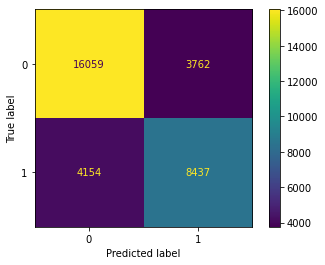

In [46]:
y_pred=best_model.predict(xt)
cm = confusion_matrix(yt, y_pred)
print('F1-score(лучшая модель)=', f1_score(yt, y_pred))
print('Recall-score(лучшая модель)=',  recall_score(yt, y_pred))
cm_display = ConfusionMatrixDisplay(cm).plot()
plt.show()

**Вывод** 
Модель получилась любопытная, она крайне хорошо определяет, что клиентов, которые отменяют брони, но примерно в половине случае ошибается, и считается, что благонадёжные брони также будут отменены. Это может стать опасным для бизнеса, если со всех клиентов начнут требовать предоплату. Но давайте посмотрим хотя бы какие результаты она обещает по прибыли.

Продолжим тест на адекватность и сравним показатель F1 с более прямолинейными моделями

In [47]:
str=["most_frequent", "prior", "stratified", "uniform"]
output=pd.DataFrame(columns=['model','F1','roc_auc','recall'])
for i in str:
    dummy_clf = DummyClassifier(strategy=i)
    dummy_clf.fit(x, y)
    y_pred=dummy_clf.predict(x)
    probabilities = dummy_clf.predict_proba(xt)
    probabilities_one_valid = probabilities[:, 1]
    predictions=dummy_clf.predict(xt)
    f1_= f1_score(yt, predictions)
    roc_auc_ = roc_auc_score(yt, probabilities_one_valid)
    rcll=recall_score(yt, predictions)
    output.loc[len(output)] = [i,f1_,roc_auc_,rcll]   


In [48]:
display(output)

,model,F1,roc_auc,recall
0,most_frequent,0.000000,0.500000,0.000000
1,prior,0.000000,0.500000,0.000000
2,stratified,0.438915,0.498633,0.504328
3,uniform,0.443046,0.500000,0.506155


К счастью прямолинейные методы сильно уступают нашей модели, так что заказчик не сможет нам сказать, что если бы я просто брал предоплату случайным образом, я бы получил результат лучше чем у вашей модели.

### Рассчитываем величину предоплаты

Стоимость номеров отеля:
категория A: за ночь — 1 000, разовое обслуживание — 400;
категория B: за ночь — 800, разовое обслуживание — 350;
категория C: за ночь — 600, разовое обслуживание — 350;
категория D: за ночь — 550, разовое обслуживание — 150;
категория E: за ночь — 500, разовое обслуживание — 150;
категория F: за ночь — 450, разовое обслуживание — 150;
категория G: за ночь — 350, разовое обслуживание — 150.

In [49]:
#Создадим столбцы для вспомогательных рассчётов
dft['night_price']=0
dft['rs_price']=0
dft['season']=0
dft['season_bonus']=0
#Создадим списки для заполнения вспомогательных столбцов
rooms=sorted(list(dft['reserved_room_type'].unique()))
nps=[1000,800,600,550,500,450,350]
rsps=[400,350,350,150,150,150,150,150]
season_bonus=[0,1.2,1.4,1.2]
seasons=[1,2,3,4]
#Занесём в нашу таблицу стоимость комнаты, обуслуживания и коэффициент по каждой записи
for ro in range(len(rooms)):
    dft.loc[dft['reserved_room_type']==rooms[ro],'night_price']=nps[ro]
    dft.loc[dft['reserved_room_type']==rooms[ro],'rs_price']=rsps[ro]
for se in range(len(seasons)):
    dft.loc[(dft['arrival_date_week_number']<=8)|(dft['arrival_date_week_number']>=48) ,'season']=seasons[0]
    dft.loc[(dft['arrival_date_week_number']>8)|(dft['arrival_date_week_number']<=22) ,'season']=seasons[1]
    dft.loc[(dft['arrival_date_week_number']>22)|(dft['arrival_date_week_number']<=35) ,'season']=seasons[2]
    dft.loc[(dft['arrival_date_week_number']>35)|(dft['arrival_date_week_number']<48) ,'season']=seasons[3]
    dft.loc[dft['season']==seasons[se],'season_bonus']=season_bonus[se]         

In [50]:
#Рассчитаем величину убытка в случае отмены брони — это стоимость одной уборки и одной ночи с учётом сезонного коэффициента.
dft['loss']=(dft['night_price'])*dft['season_bonus']+dft['rs_price']
#Рассчитаем величину предоплаты в случае если модель предсказывает отмену Размер депозита — 80% от стоимости номера за одни сутки и затрат на разовую уборку. 
dft['predoplata']=0.8*dft['loss']
#Но предоплату мы получаем, только если модель предсказывает отмену брони. Отразим это:
dft['predict']=best_model.predict(xt)
dft['is_canceled']=yt
dft.loc[dft['predict']==0,'predoplata']=0
#А списываем мы себе предопалту, только в том случае, если бронь и правда была отменена
dft.loc[dft['is_canceled']==0,'predoplata']=0
#Рассчитаем выручку по неотменённым броням
dft['revenue']=dft['night_price']*dft['season_bonus']*(dft['stays_in_weekend_nights']+dft['stays_in_week_nights'])
dft.loc[(dft['stays_in_weekend_nights']+dft['stays_in_week_nights'])==1.0,'revenue']=dft['revenue']*dft['season_bonus']-dft['rs_price']
dft.loc[(dft['stays_in_weekend_nights']+dft['stays_in_week_nights'])>1.0,'revenue']=dft['revenue']-dft['rs_price']*(1+(dft['stays_in_weekend_nights']+dft['stays_in_week_nights'])//2)
dft.loc[dft['is_canceled']==1,'revenue']=0
total_rev=dft['revenue'].sum()

###  Рассчитываем чистую прибыль сети отелей с учётом эффекта от предоплаты.

In [51]:
full_loss=dft.loc[dft['is_canceled'] == 1, 'loss'].sum()
locale.setlocale(locale.LC_ALL, ('ru_RU', 'UTF-8'))


'ru_RU.UTF-8'

In [52]:
full_predoplata=dft['predoplata'].sum()
fin_rez=full_predoplata-full_loss
print('(Предоплата=',locale.currency( full_predoplata, grouping=True ),")-(","Убытки=",locale.currency( full_loss, grouping=True ),")=",locale.currency(fin_rez, grouping=True ))

(Предоплата= 9 649 984,00 ₽ )-( Убытки= 17 652 340,00 ₽ )= -8 002 356,00 ₽


In [53]:
print('Выручка от тех кто не отменил бронирование=',locale.currency( total_rev, grouping=True ))

Выручка от тех кто не отменил бронирование= 49 916 104,00 ₽


In [54]:
print('Выручка без учёта предопалты=',locale.currency( total_rev-full_loss, grouping=True ))

Выручка без учёта предопалты= 32 263 764,00 ₽


In [55]:
print('Выручка с учётом предопалты=',locale.currency( total_rev-full_loss+full_predoplata, grouping=True ))

Выручка с учётом предопалты= 41 913 748,00 ₽


**Вывод:**

Весьма недурной результат мы получили. Модель предсказывает достаточно точно, и в результате мы снизили наш убыток почти в три раза, с 17,6 миллионов до 5,2 миллионов. Это многократно превосходит бюджет, заложенный на создание системы прогнозирования в 400 тыс. руб. Руководство сети отелей конечно хотело бы видеть выход в прибыль, но, учитывая все вводные и ограничения, это невозможно. Даже если построить модель которая всегда угадывает, убыток будет сокращён в лучшем случае на 80%.

Внедрение модели и системы предоплат для сомнительного бронирования позволит получать совокупную выручку порядка 44,6 млн. против 32,2 млн. без предоплат.

Очевидно, что вложение жалких 400 000 в построение модели это крайне удачная инвестиция, и её надо реализовать как можно скорее.

## Опишите портрет «ненадёжного» клиента

In [56]:
# Оценка важности факторов
result = permutation_importance(best_model, xt, yt, n_repeats=10, random_state=1)

# Вывод важности факторов
factors=pd.DataFrame(columns=['factor','importance'])
for i, importance in enumerate(result.importances_mean):
    factors.loc[len(factors)] = [xt.columns[i],importance]   

In [57]:
factors.sort_values(by='importance', ascending=False).head(5)

,factor,importance
0,lead_time,0.071335
19,country_PRT,0.058191
9,total_of_special_requests,0.053675
32,customer_type_Transient,0.009768
34,required_car_parking_spaces_1,0.008642


**ВЫВОД**

Мы получили ПОТ-5 факторов (так как потом важность факторов совсем уж низкая), по которым наша лучшая модель вычисляет "неблагонадёжных клиентов". Если заявка сделана сильно разарнее, чем больше горизонт прогнозирования, тем выше неопределённость. Остутствие особых пожеланий. Если человек тут ничего не написал, значит вопрос недостаточно проработал, и легко откажется при первом же сомнении. Страна - Португалия. Может большая часть отелей в Португалии, и местные не особо расстроятся если не поедут, а для путешественников из других стран, отмена брони это уже редкий случчай. Ну и в меньшей степени является большое количество изменений в брони. Если человек начал метаться, то ему одно поменяй, то другое, то уже есть сомнения в его "благонадёжности". Ну и если он не связан с договором или организованной группой - это тоже понятно. Когда ни с кем не связан, отказаться проще.

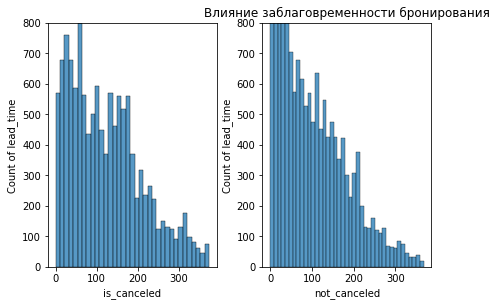

In [61]:
#Теперь посмотрим как эти ПОТ-5 показателей представлены в нашем тестовом наборе данных на графиках.
fig, ax =plt.subplots(1,2)
sn.histplot(data=dft.loc[dft['is_canceled']==1]['lead_time'], ax=ax[0]).set(xlabel='is_canceled', ylabel='Count of lead_time')
ax[0].set_ylim(0, 800)
sn.histplot(data=dft.loc[dft['is_canceled']==0]['lead_time'], ax=ax[1]).set(xlabel='not_canceled', ylabel='Count of lead_time')
ax[1].set_ylim(0, 800)
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
plt.title('Влияние заблаговременности бронирования')
plt.show()

На графиках видно, что в районе нуля есть уходящий в небеса пик, количества людей которые делают и не отменяют потом заявки. У тех кто реально отменил - на нуле как раз просадка. А хвост отмен с бронированием более чем за 300 дней заметно более высокий, чем чем у тех кто брони не отменяет.

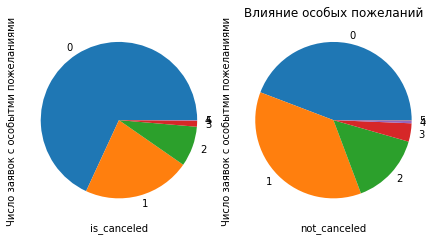

In [63]:
fig, ax =plt.subplots(1,2)
dft.loc[dft['is_canceled']==1].groupby(['total_of_special_requests'])['is_canceled'].\
                                count().plot(kind='pie',subplots=True,ax=ax[0])
ax[0].set(xlabel='is_canceled', ylabel='Число заявок с особытми пожеланиями')
dft.loc[dft['is_canceled']==0].groupby(['total_of_special_requests'])['is_canceled'].\
                                count().plot(kind='pie',subplots=True,ax=ax[1])
ax[1].set(xlabel='not_canceled', ylabel='Число заявок с особытми пожеланиями')
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
plt.title('Влияние особых пожеланий')
plt.show()


На графиках видно, что на отменённых заявках количество сособых пожеланий кратно меньше, чем у "неблагонадёжных" если они вообще есть. Соответственно их полное отсутствие у тех, кто не отменяет бронь встречается реже чем в половине случаев.

In [64]:
text=list(dft.loc[dft['is_canceled']==1]['country'])
text_raw = " ".join(text)

In [65]:
wordcloud1 = WordCloud(width = 2000, 
                      height = 1500, 
                      random_state=1, 
                      background_color='red', 
                      margin=5, 
                      colormap='Pastel1', 
                      collocations=False).generate(text_raw)


In [66]:
text=list(dft.loc[dft['is_canceled']==0]['country'])
text_raw = " ".join(text)
wordcloud2 = WordCloud(width = 2000, 
                      height = 1500, 
                      random_state=1, 
                      background_color='green', 
                      margin=5, 
                      colormap='Pastel1', 
                      collocations=False).generate(text_raw)

Влияние страны из которой будут гости


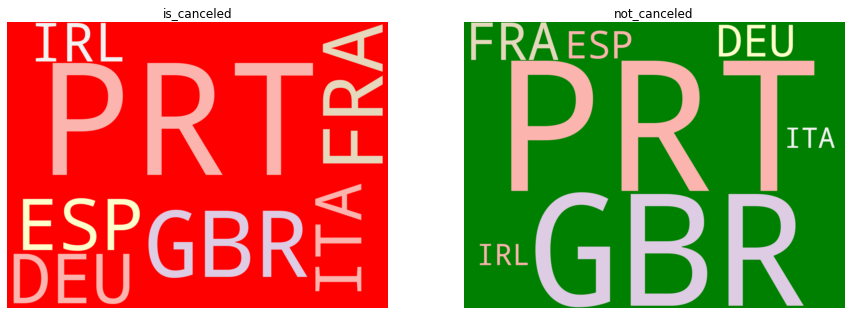

In [74]:
print("Влияние страны из которой будут гости")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

ax1.imshow(wordcloud1, interpolation='bilinear')
ax1.axis('off')
ax1.set(title='is_canceled')

ax2.imshow(wordcloud2, interpolation='bilinear')
ax2.axis('off')
ax2.set(title='not_canceled')
plt.show()

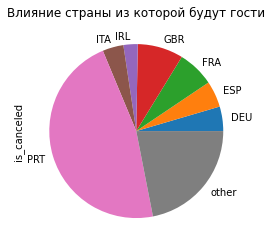

In [76]:
dft.loc[dft['is_canceled']==1].groupby(['country'])['is_canceled'].\
                                count().plot(kind='pie',subplots=True)
plt.title('Влияние страны из которой будут гости')
plt.show()

Португалия явный лидер по числу "неблагонадёжных" бронирований, причём идёт с большим отрывом. У тех, кто не отменяет брони, они делит первенство с Великобританией, и франция на её фоне не такая уж и маленькая.

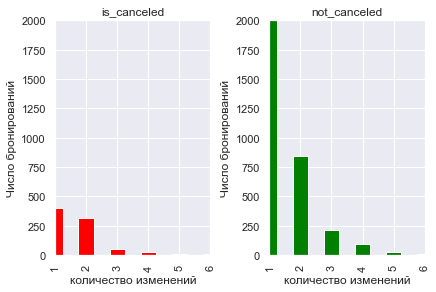

In [78]:
sn.set(style="darkgrid")
fig, ax =plt.subplots(1,2)
dft.loc[dft['is_canceled']==1].groupby(['booking_changes'])['is_canceled'].\
                                count().plot(kind='bar',subplots=True,ax=ax[0],color='red')
ax[0].set(xlabel='количество изменений', ylabel='Число бронирований')
ax[0].set_title('is_canceled')
ax[0].set_ylim(0, 2000)
ax[0].set_xlim(1, 6)
dft.loc[dft['is_canceled']==0].groupby(['booking_changes'])['is_canceled'].\
                                count().plot(kind='bar',subplots=True,ax=ax[1],color='green')
ax[1].set(xlabel='количество изменений', ylabel='Число бронирований')
ax[1].set_ylim(0, 2000)
ax[1].set_xlim(1, 6)
ax[1].set_title('not_canceled')
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
plt.show()

Графики достаточно чётко показывают, что чем больше изменений, тем чаще отказы от бронирование. Правда количество таких историй невелико, потому и степень влияния на модель мала.

In [79]:
data=dft.groupby(['customer_type','is_canceled'])['is_canceled'].count()
data=data.reset_index(level=['customer_type'])
data = data.rename(columns={'is_canceled': 'count'})
data=data.reset_index(level=['is_canceled'])
data

,is_canceled,customer_type,count
0,0,Contract,314
1,1,Contract,45
2,0,Group,157
3,1,Group,8
4,0,Transient,15656
5,1,Transient,11805
6,0,Transient-Party,3694
7,1,Transient-Party,733


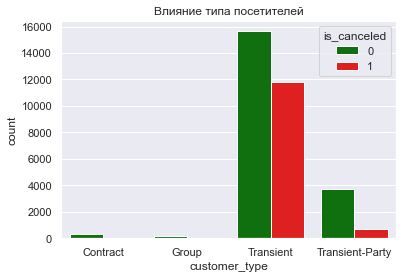

In [81]:
palette ={0: "green", 1: "red"}
sn.barplot(data=data, x="customer_type", y="count", hue="is_canceled", palette=palette)
plt.title('Влияние типа посетителей')
plt.show()

По типу клиента видно, что статистически заметный только два типа клиентов, и заметная доля отказов наблюдается только в самом сонвоном -Transient, но зато если тип килента отоличается, то и размер аннулированных броней сразу начинает стремиться к нулю. Это можно объяснить так, что все случайные посетители сайта Transient и они как раз склонны к анулированию, все кто хоть как-то отличается уже скорее всего приедут, раз обещали.

**ВЫВОД**

Портрет потенциально отменённой брони выглядит так:
Португалец, случайно зашедший на сайт, делает бронь на весьма отдалённую перспективу, при этом не имеет особых пожеланий, и ещё и начинает потом вносить изменения в бронь. С таких сразу надо брать предоплату.

## Общий вывод

Была проделана работа по исследованию исходных данных. Данные были достаточно высокого качества, пропусков не было, пришлось удалить несколько выбросов, кое-где поменять типы данных и тогда уже перейти к созданию модели.
Все категориальные переменные были переведены в логические с помощью One-Hot-Encoding. Показатели с высоким уровне взаимной корреляции в модель не включались. 

Для борьбы с дисбалансом классов, применили технику передискретизации синтетических меньшинств.

Были обучены несколько моделей наиболее распространённых классификаторов, потом они были подвергнуты кросс-валидации. В результате была выбрана основная модель - с самой лучшей метрикой recall - т.е. лучше отсекающая тех, кто отменяет бронирование. Для неё произведена оптимизация гипер-параметров по итогпм которой улучшили показатель recall, т.е. понизили вероятность ошибки при определении тех броней, которые в итоге были отменены.

Оптимизированную модель приенили к тестовой выборке, чтобы определить по каким заявкам на бронирование следует брать предоплату.

Дальше рассчитали прибыль и эффект от внедрения практики запроса предоплаты на основе предложенной модели.

Дополнительно был представлен портрет типичного "ненадёжного" клиента, на основе силы влияния разных факторов на предсказания модели и исследовательского анализа тестовой выборки по тем кто отменил бронь, и тем кто нет.

**Рекомендации бизнесу**

Внедрить практику запроса предоплаты на основании предсказания модели. Это позволит сократить убыток, возникающий при снятии бронирования почти в 2 раза, и эффект будет кратно превышать затраты, связанные с разработкой модели.

Для более качественного анализа необходимо учитывать не только выручку и упущенную выгоду, но и себестоимость. Ещё можно провести дополнительное исследование по поводу того, как часто удаётся заместить отменённую бронь новым поселением, и также учать этот эффект в расчёте прибыли.

Базу данных можно дополнительно оптимизировать для дальнейших исследований.
- Сразу хранить значения stays_in_weekend_nights, adults, children, babies, required_car_parking_spaces как Float.
- Делать дополнительную проверку, если пользователь вводит количество взрослых=0.
- Выяснить откуда берётся отмена брони свыше 20 раз.
- Можно привязать процент запрашиваемой предоплаты к вероятности отмены бронирования, которую предсказывает модель.